# Reimplementacion de CNN en Pytorch

Para esta primera parte de la tarea decidi re-implementar el ejemplo de CNN preentrenado e implementado en Keras que vimos en clases (https://inf395.github.io/ejemplos/cnn-02-pretr.html), logrando emular casi a la perfeccion los resultados obtenidos en esta implementacion de Pytorch.

**Carga de Bibliotecas, Imágenes y Modelo**

Comenzamos por preparar el entorno para procesar imágenes con el modelo ResNet50 preentrenado, se instalan e importan las librerías necesarias y descomprime las imágenes desde un archivo ZIP, luego define una transformación que redimensiona, normaliza y convierte las imágenes en tensores, además de una función load_image() que aplica estas transformaciones a cada imagen y finalmente, carga el modelo ResNet50 con pesos preentrenados de ImageNet y lo pone en modo de evaluación para su uso en inferencia.

In [2]:
%pip install numpy matplotlib pillow torch torchvision scikit-learn h5py imageio

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [3]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from zipfile import ZipFile
import torch
import torch.nn as nn
import torchvision.transforms as transforms
import torchvision.models as models
from torchvision.io import read_image
from sklearn.manifold import TSNE
import h5py
from torchvision.models import ResNet50_Weights
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from imageio.v2 import imread

if not os.path.exists("images_resize"):
    print('Extracting image files...')
    with ZipFile('images_pascalVOC.zip') as zf:
        zf.extractall('.')

image_paths = ["images_resize/" + p for p in sorted(os.listdir("images_resize")) if p.endswith(".jpg")]

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(), 
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

def load_image(path):
    img = Image.open(path).convert('RGB')
    return transform(img).unsqueeze(0) 

model = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V1)
model.eval()
print(model)

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to C:\Users\juanp/.cache\torch\hub\checkpoints\resnet50-0676ba61.pth


100%|██████████| 97.8M/97.8M [00:02<00:00, 37.9MB/s]


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

**Clasificacion Completa**

Se realiza una clasificación completa de una imagen, aplicando las transformaciones estándar de ImageNet, la pasa por el modelo sin calcular gradientes y obtiene las predicciones y luego identifica las cinco clases con mayor probabilidad y las imprime, y finalmente visualiza la imagen analizada.


Top 5 predicciones:
convertible: 12.7655
sports car: 12.0382
car wheel: 9.0643
beach wagon: 8.8481
grille: 7.8986


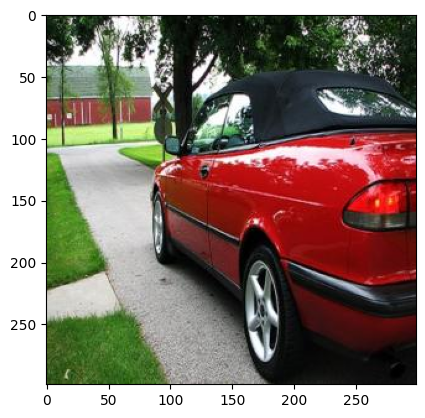

In [4]:
weights = ResNet50_Weights.IMAGENET1K_V1
preprocess = weights.transforms()

img_path = "images_resize/000007.jpg"
img = Image.open(img_path).convert("RGB")
img_pre = preprocess(img).unsqueeze(0)

with torch.no_grad():
    preds = model(img_pre)
    
class_names = weights.meta["categories"]
top5_idx = torch.topk(preds, 5).indices[0].tolist()

print("\nTop 5 predicciones:")
for i in top5_idx:
    print(f"{class_names[i]}: {preds[0, i].item():.4f}")

plt.imshow(img)
plt.show()

**Representacion Intermedias**

Obtenemos representaciones intermedias del modelo ResNet50 eliminando su capa final de clasificación, creando un modelo base que produce vectores de características en lugar de etiquetas, y define la función get_representation() para obtener esas representaciones a partir de una imagen procesada.

In [5]:
base_model = nn.Sequential(*list(model.children())[:-1])
base_model.eval()

def get_representation(img_tensor):
    with torch.no_grad():
        out = base_model(img_tensor)
    return out.squeeze().numpy()

rep = get_representation(img_pre)
print("Shape de la representación:", rep.shape)
print("Proporción de ceros:", np.mean(rep == 0.0))

Shape de la representación: (2048,)
Proporción de ceros: 0.00048828125


**Representacion de todas las Imagenes**

Extraemos las representaciones intermedias de todas las imágenes del conjunto usando el modelo base, para cada imagen, aplica las transformaciones, obtiene su vector de características y los guarda en un arreglo out_tensors, luego almacena esos vectores en un archivo HDF5 (img_emb.h5), calcula estadísticas sobre los valores (ceros y negativos) y muestra un histograma con la fracción de ceros por imagen.

Proporción de ceros (primera imagen): 0.001953125
Proporción de valores negativos: 0.0


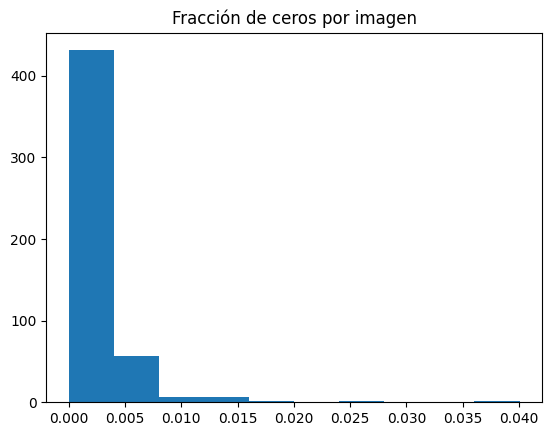

In [6]:
all_reps = []
for path in image_paths:
    img_tensor = load_image(path)
    rep = get_representation(img_tensor)
    all_reps.append(rep)

out_tensors = np.stack(all_reps)

with h5py.File('img_emb.h5', 'w') as h5f:
    h5f.create_dataset('img_emb', data=out_tensors)

print("Proporción de ceros (primera imagen):", np.mean(out_tensors[0] == 0))
print("Proporción de valores negativos:", np.mean(out_tensors < 0))

plt.hist(np.mean(out_tensors == 0.0, axis=1))
plt.title("Fracción de ceros por imagen")
plt.show()

**Grafico t-SNE de Embeddings con y sin Imagenes**

Utilizamos t-SNE para reducir las representaciones de las imágenes a dos dimensiones y así visualizarlas, aplicando la técnica con una perplejidad de 30 para preservar las relaciones entre muestras, generando las coordenadas reducidas y mostramos un gráfico de dispersión que representa visualmente la similitud entre los embeddings de las imágenes, ademas muestra el mismo grafico pero con la imagen correspondiente a cada embedding.

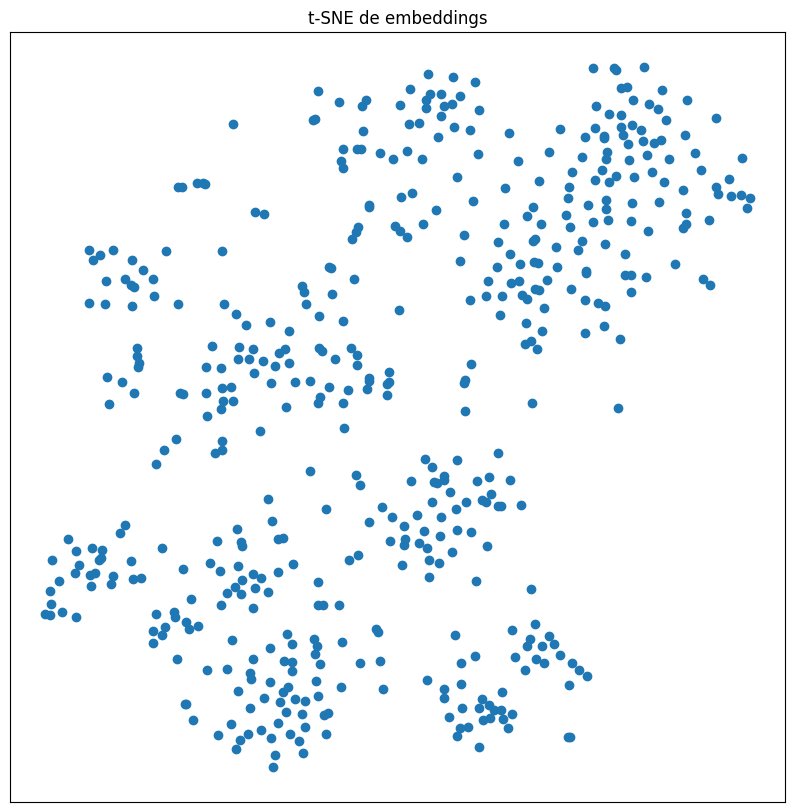

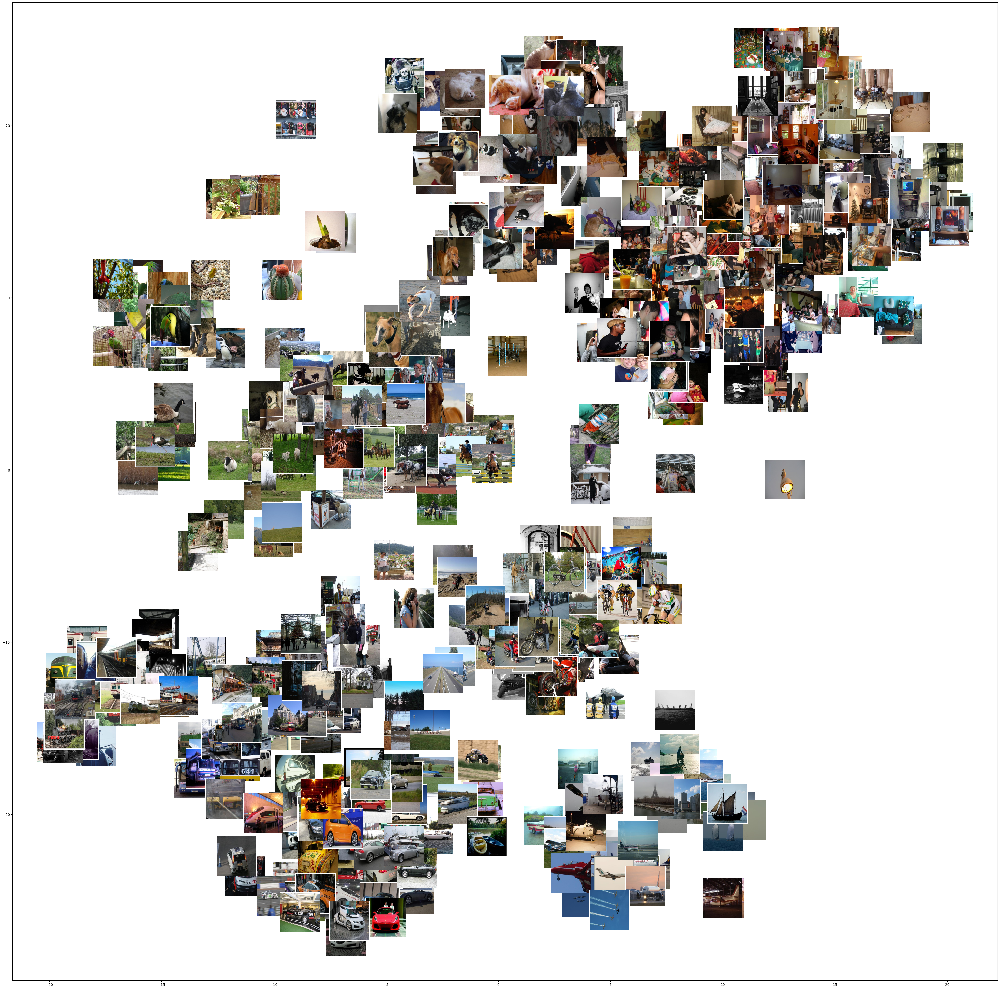

In [7]:
img_emb_tsne = TSNE(perplexity=30, random_state=42).fit_transform(out_tensors)

plt.figure(figsize=(10, 10))
plt.scatter(img_emb_tsne[:, 0], img_emb_tsne[:, 1])
plt.title("t-SNE de embeddings")
plt.xticks([]); plt.yticks([])
plt.show()

def imscatter(x, y, paths, ax=None, zoom=1, linewidth=0):
    if ax is None:
        ax = plt.gca()
    artists = []
    for x0, y0, p in zip(x, y, paths):
        try:
            im = imread(p)
        except:
            continue
        im = Image.fromarray(im).resize((224, 224))
        im = OffsetImage(np.array(im), zoom=zoom)
        ab = AnnotationBbox(im, (x0, y0), xycoords='data',
                            frameon=True, pad=0.1, 
                            bboxprops=dict(edgecolor='red',
                                           linewidth=linewidth))
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([x, y]))
    ax.autoscale()
    return artists

fig, ax = plt.subplots(figsize=(50, 50))
imscatter(img_emb_tsne[:, 0], img_emb_tsne[:, 1], image_paths, zoom=0.5, ax=ax)
plt.savefig('tsne_pytorch.png')

**Imágenes más Similares**

Construimos una funcion que permite encontrar y mostrar las imágenes más similares a una imagen dada según sus embeddings, definiendo display() para visualizar una imagen y most_similar() para calcular las distancias euclidianas entre representaciones, ordenarlas y obtener las más cercanas, y luego muestra en pantalla las cinco más parecidas según sus características extraídas por el modelo.

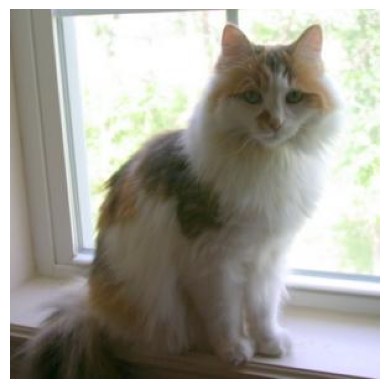

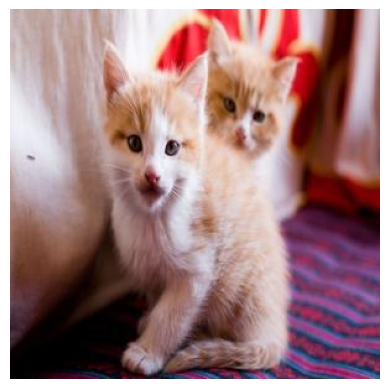

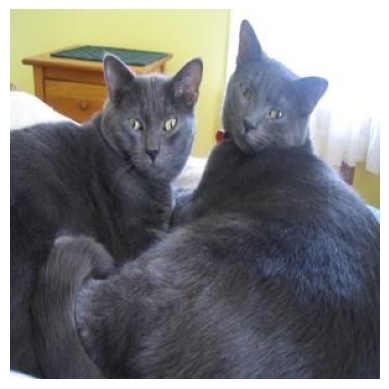

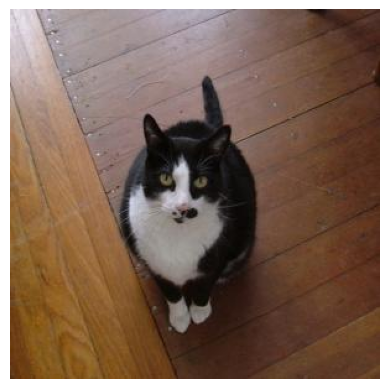

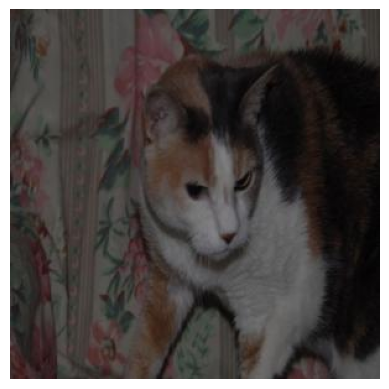

In [8]:
def display(img_path):
    plt.figure()
    plt.imshow(Image.open(img_path))
    plt.axis('off')
    plt.show()

def most_similar(idx, top_n=5):
    dists = np.linalg.norm(out_tensors - out_tensors[idx], axis=1)
    sorted_idx = np.argsort(dists)
    return sorted_idx[:top_n]

idx = 57
sim = most_similar(idx)
for s in sim:
    display(image_paths[s])

**Distancias y Cosenos de Similitud**
 
Calculamos la similitud coseno entre las representaciones normalizadas de las imágenes, normalizando los vectores de características, seleccionando una imagen de referencia (índice 208) y obtienemos el coseno de similitud con todas las demás, y luego muestra un histograma de las similitudes, visualiza la imagen base y presenta las imágenes que superan un umbral de similitud (0.44), mostrando las más relacionadas visualmente.

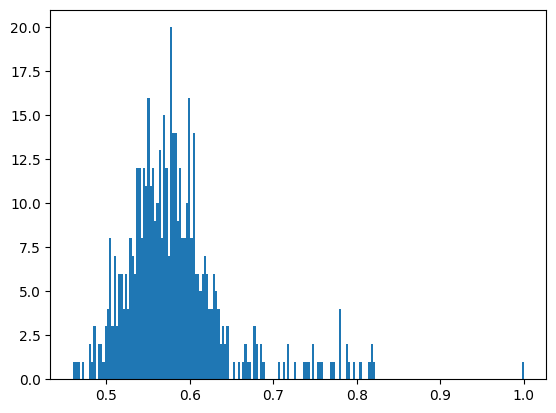

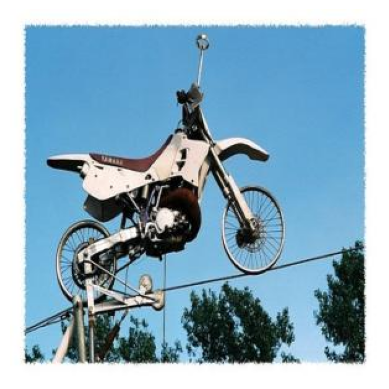

(array([  4,   9,  12,  60,  82, 109, 151, 170, 186, 187, 205, 208, 225,
       260, 265, 280, 310, 330, 331, 355, 391, 397, 400, 403, 420, 435,
       474, 486, 490]),)


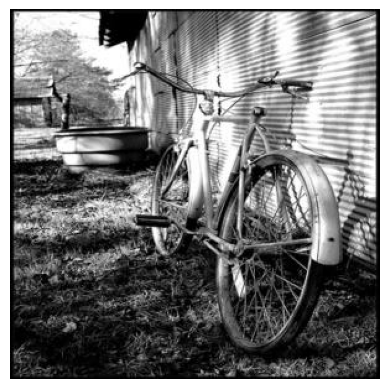

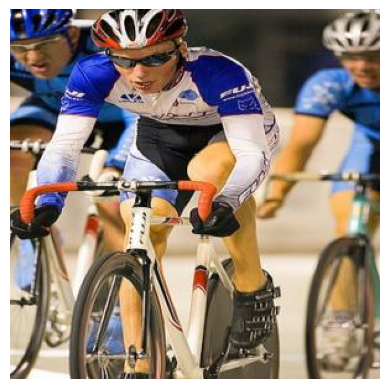

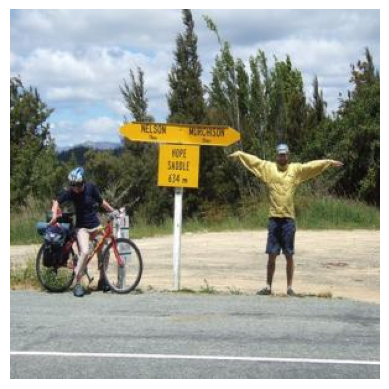

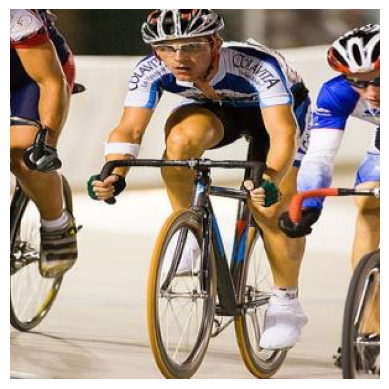

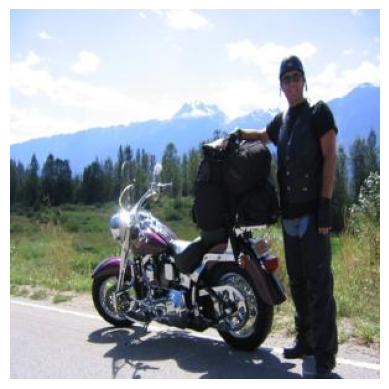

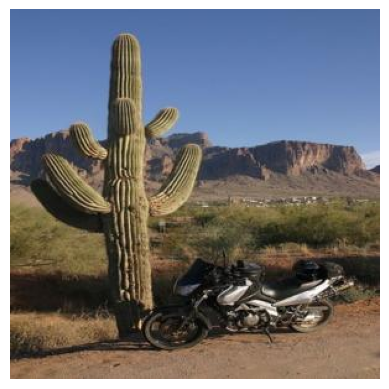

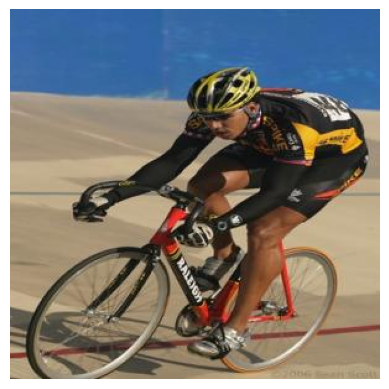

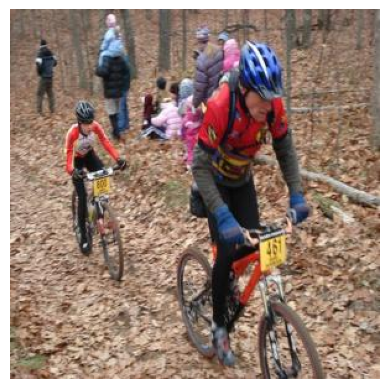

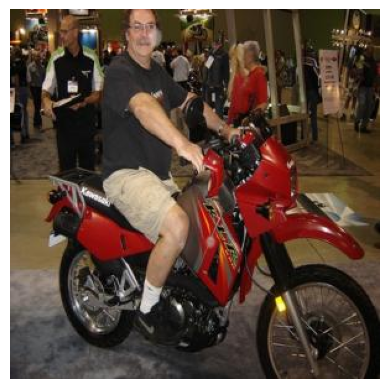

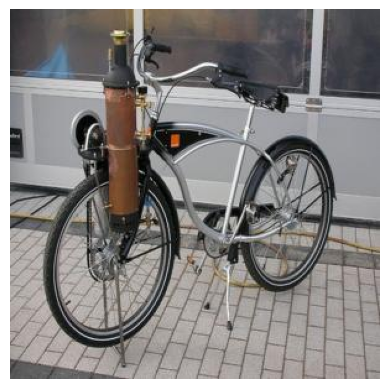

In [9]:
out_norms = np.linalg.norm(out_tensors, axis=1, keepdims=True)
normed_out_tensors = out_tensors / out_norms

item_idx = 208
cos_to_item = np.dot(normed_out_tensors, normed_out_tensors[item_idx])
plt.hist(cos_to_item, bins=200)
display(image_paths[item_idx])

items = np.where(cos_to_item > 0.7) # originalmente 0.44 pero debido a resultados muy discrepantes entre si fue cambiado
print(items)
for s in items[0][:10]:
    display(image_paths[s])